# Επανάληψη scraping

In [1]:
# εισάγουμε τις βιβλιοθήκες
import requests
from bs4 import BeautifulSoup
import pandas as pd

Ας πούμε ότι θέλουμε από την efsyn.gr τους τίτλους των άρθρων των 2 πρώτων σελίδων στην ενότητα ekloges-2023.

Θέλουμε δηλαδή τα άρθρα από τη διεύθυνση "https://www.efsyn.gr/ekloges-2023?page=" και τις σελίδες 0 και 1.

In [36]:
# ορίζουμε το βασικό url
start_url = 'https://www.efsyn.gr/ekloges-2023?page='

Κάνουμε τις δοκιμές μας για μια σελίδα

In [37]:
# κατεβάζουμε τη σελίδα 
response = requests.get(start_url)
doc = BeautifulSoup(response.text, 'html.parser')

Με inspect στη συγκεκριμένη σελίδα της efsyn στο browser, βρισκουμε ότι το κάθε teaser άρθρο βρίσκεται μέσα σε ένα tag ```<article>```.

Και όλα τα teaser articles βρίσκονται μέσα σε ένα div με class: default-teaser triple

In [40]:
# τσεκάρουμε πόσα άρθρα μας φέρνει με τα συγκεκριμένα tags και επιβεβαιώνουμε τον αριθμό μετρώντας τα άρθρα στον browser
len(doc.find('div', {'class': 'default-teaser triple'}).find_all('article'))

12

In [41]:
# κοιτάμε το πρώτο article για να δούμε ποια είναι τα επιμέρους tags για τα δεδομένα που θέλουμε (url, τίτλος, section, summary, time)
doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0]

<article class="default-teaser__article default-teaser__article"> <figure> <img alt="" height="160" loading="lazy" src="/sites/default/files/styles/default_teaser/public/2023-05/androulakis-nikos-pask.jpg?itok=dPXc3SDX" typeof="foaf:Image" width="320"> </img></figure> <a class="default-teaser__cat" href="/politiki/antipoliteysi">ΑΝΤΙΠΟΛΙΤΕΥΣΗ</a> <time class="default-teaser__date default-date">23.05.2023, <strong>13:14</strong></time><div class="default-teaser__title">Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης</div><div class="default-teaser__summary"> Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερες κάλπες. Ο πρόεδρος του ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ. μεταβαίνει σήμερα το απόγευμα στην Πρόεδρο της Δημοκρατίας προκειμένου να παραλάβει την τρίτη διερευνητική εντολή, στο...</div> <a class="full-link" href="/politiki/antipoliteysi/390881_apogeyma-stin-ptd-o-nikos-androylakis">Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης </a> </article>

In [42]:
url = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0].find('a', {'class': 'full-link'})['href']
url

'/politiki/antipoliteysi/390881_apogeyma-stin-ptd-o-nikos-androylakis'

Παρατηρούμε ότι το link δεν είναι ολόκληρο, οπότε θα προσθέτουμε αρχή το ```'https://www.efsyn.gr'```

In [43]:
title = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0].find('a', {'class': 'full-link'}).text
title

'Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης '

In [44]:
time = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0].find('time').text
time

'23.05.2023, 13:14'

In [46]:
section = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0].find('a', {'class': 'default-teaser__cat'}).text
section

'ΑΝΤΙΠΟΛΙΤΕΥΣΗ'

In [47]:
summary = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')[0].find('div', {'class': 'default-teaser__summary'}).text
summary

' Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερες κάλπες. Ο πρόεδρος του ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ. μεταβαίνει σήμερα το απόγευμα στην Πρόεδρο της Δημοκρατίας προκειμένου να παραλάβει την τρίτη διερευνητική εντολή, στο...'

Φτιάχνουμε τον κώδικα για τη συλλογή των δεδομένων από κάθε άρθρο και τον δοκιμάζουμε για τα άρθρα από τη σελίδα που φέραμε 

In [50]:
# Ξεκινάμε με μια άδεια λίστα
stories_list = []
stories = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')
for story in stories:
    # Φτιάχνουμε ένα λεξικό χωρίς τίποτα
    story_dict = {}
    # link
    try:
      link = story.find('a', {'class': 'full-link'})['href'] 
      story_dict['url'] = link
    except:
      story_dict['url'] = ''
      pass
    # title
    try:
      title = story.find('a', {'class': 'full-link'}).text
      story_dict['title'] = title
    except:
      story_dict['title'] = ''
      pass
    # time
    try:
      time = story.find('time').text
      story_dict['time'] = time
    except:
      story_dict['time'] = ''
      pass
    # section
    try:
      section = story.find('a', {'class': 'default-teaser__category'}).text
      story_dict['section'] = section
    except:
      story_dict['section'] = ''
      pass
    # summary
    try:
      summary = story.find('div', {'class': 'default-teaser__summary'}).text
      story_dict['summary'] = summary
    except:
      story_dict['summary'] = ''
      pass
    # Προσθέτουμε το λεξικό στη λίστα 
    stories_list.append(story_dict)
    
# Δημιουργούμε dataframe από τη λίστα με τα dictionaries
efsyn_df = pd.DataFrame(stories_list)

In [51]:
efsyn_df

,url,title,time,section,summary
0,/politiki/antipoliteysi/390881_apogeyma-stin-p...,Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης,"23.05.2023, 13:14",,Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερ...
1,/politiki/boyli/390878_ta-aderfia-belopoyloi-s...,Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετ...,"23.05.2023, 13:04",,Ο Κυριάκος Βελλόπουλος και ο Δημήτρης Βενιέρη...
2,/politiki/antipoliteysi/390874_okde-ektimisi-t...,ΟΚΔΕ: Εκτίμηση του εκλογικού αποτελέσματος,"23.05.2023, 12:52",,"«Με 40,8% και πάνω από 2,4 εκ. ψήφους (από 39..."
3,/politiki/antipoliteysi/390873_ti-tha-kanei-pa...,Τι θα κάνει το ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ με τη διερευνητικ...,"23.05.2023, 12:40",,Κλειστά τα χαρτιά του κρατάει το κόμμα της Χα...
4,/politiki/390854_i-itta-sta-social-media,Η ήττα στα social media,"23.05.2023, 12:30",,Σε έναν στρόβιλο συναισθημάτων βρίσκονται οι ...
5,/politiki/paraskinia/390850_galazia-patrida,Γαλάζια πατρίδα,"23.05.2023, 11:58",,Ολος ο εκλογικός χάρτης αυτή τη φορά βάφτηκε ...
6,/politiki/390840_rodopi-galatiko-horio-me-toys...,Ροδόπη: το «γαλατικό χωριό» με τους καβγάδες του,"23.05.2023, 11:35",,Βρισκόμαστε στο 2023 μ.Χ. Ολη η χώρα έχει πέσ...
7,/politiki/390833_i-proti-anagnosi-toy-apoteles...,Η πρώτη ανάγνωση του αποτελέσματος από τα κόμμ...,"23.05.2023, 11:14",,"Ανοδο, έστω και μικρή, στις περισσότερες περι..."
8,/politiki/antipoliteysi/390857_analambano-aker...,"«Αναλαμβάνω ακέραια την ευθύνη, θα δώσουμε μάχ...","23.05.2023, 11:05",,«Απρόσμενα οδυνηρό το σοκ. Συγγνώμη από τους ...
9,/politiki/paraskinia/390853_den-brike-oyte-tin...,Δεν βρήκε ούτε την ψήφο του...,"23.05.2023, 10:52",,Την κυριολεκτική της έννοια φαίνεται πως απέκ...


Διορθώνουμε τον κώδικα για να παίρνουμε το πλήρες url και τον βάζουμε σε μια λούπα για να πάρουμε άρθρα από 2 σελίδες 

In [52]:
start_url = 'https://www.efsyn.gr/ekloges-2023?page='
main_url = 'https://www.efsyn.gr' # για να το προσθέτουμε στα ελλειπή links

stories_list = []

# φτιάχνουμε τη λούπα που ο scraper θα μπαίνει σε καθε μια από τις σελίδες για να φέρνει τα άρθρα
for i in range(0, 2):
  url = start_url + str(i)
  response = requests.get(url)
  doc = BeautifulSoup(response.text, 'html.parser')
  stories = doc.find('div', {'class': 'default-teaser triple'}).find_all('article')
  for story in stories:
      # Φτιάχνουμε ένα λεξικό χωρίς τίποτα
      story_dict = {}
      # link
      try:
        link = story.find('a', {'class': 'full-link'})['href'] 
        story_dict['url'] = main_url + link
      except:
        story_dict['url'] = ''
        pass
      # title
      try:
        title = story.find('a', {'class': 'full-link'}).text
        story_dict['title'] = title
      except:
        story_dict['title'] = ''
        pass
      # time
      try:
        time = story.find('time').text
        story_dict['time'] = time
      except:
        story_dict['time'] = ''
        pass
      # section
      try:
        section = story.find('a', {'class': 'default-teaser__category'}).text
        story_dict['section'] = section
      except:
        story_dict['section'] = ''
        pass
      # summary
      try:
        summary = story.find('div', {'class': 'default-teaser__summary'}).text
        story_dict['summary'] = summary
      except:
        story_dict['summary'] = ''
        pass
      # Προσθέτουμε το λεξικό στη λίστα 
      stories_list.append(story_dict)
    
# Δημιουργούμε dataframe από τη λίστα με τα dictionaries
efsyn_df = pd.DataFrame(stories_list)

In [53]:
efsyn_df

,url,title,time,section,summary
0,https://www.efsyn.gr/politiki/antipoliteysi/39...,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...,"23.05.2023, 13:50",,Στο δρόμο του ασίγαστου λαϊκού αγώνα για να α...
1,https://www.efsyn.gr/politiki/390876_mplok-ton...,Το μπλοκ των «ικανοποιημένων» και η… απιστία τ...,"23.05.2023, 13:41",,Τι εκπροσωπεί το θριαμβευτικό εκλογικό αποτέλ...
2,https://www.efsyn.gr/politiki/antipoliteysi/39...,Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης,"23.05.2023, 13:14",,Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερ...
3,https://www.efsyn.gr/politiki/boyli/390878_ta-...,Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετ...,"23.05.2023, 13:04",,Ο Κυριάκος Βελλόπουλος και ο Δημήτρης Βενιέρη...
4,https://www.efsyn.gr/politiki/antipoliteysi/39...,ΟΚΔΕ: Εκτίμηση του εκλογικού αποτελέσματος,"23.05.2023, 12:52",,"«Με 40,8% και πάνω από 2,4 εκ. ψήφους (από 39..."
5,https://www.efsyn.gr/politiki/antipoliteysi/39...,Τι θα κάνει το ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ με τη διερευνητικ...,"23.05.2023, 12:40",,Κλειστά τα χαρτιά του κρατάει το κόμμα της Χα...
6,https://www.efsyn.gr/politiki/390854_i-itta-st...,Η ήττα στα social media,"23.05.2023, 12:30",,Σε έναν στρόβιλο συναισθημάτων βρίσκονται οι ...
7,https://www.efsyn.gr/politiki/paraskinia/39085...,Γαλάζια πατρίδα,"23.05.2023, 11:58",,Ολος ο εκλογικός χάρτης αυτή τη φορά βάφτηκε ...
8,https://www.efsyn.gr/politiki/390840_rodopi-ga...,Ροδόπη: το «γαλατικό χωριό» με τους καβγάδες του,"23.05.2023, 11:35",,Βρισκόμαστε στο 2023 μ.Χ. Ολη η χώρα έχει πέσ...
9,https://www.efsyn.gr/politiki/390833_i-proti-a...,Η πρώτη ανάγνωση του αποτελέσματος από τα κόμμ...,"23.05.2023, 11:14",,"Ανοδο, έστω και μικρή, στις περισσότερες περι..."


# Διανυσματοποίηση Εγγράφων/κειμένων (Vectorization)

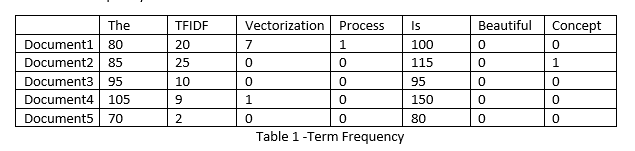

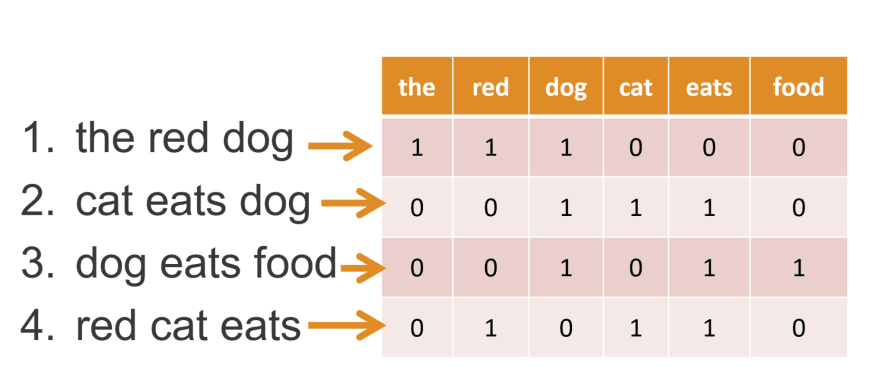

In [56]:
import numpy as np 

θα χρησιμοποιήσουμε τα παραπάνω άρθρα που μαζέψαμε από την efsyn

In [54]:
efsyn_df.head(1)

,url,title,time,section,summary
0,https://www.efsyn.gr/politiki/antipoliteysi/39...,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...,"23.05.2023, 13:50",,Στο δρόμο του ασίγαστου λαϊκού αγώνα για να α...


Ας ενώσουμε τον τίτλο με το summary

In [58]:
efsyn_df['text'] = efsyn_df['title'] + efsyn_df['summary']
efsyn_df.loc[0, 'text']

'Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδικάστε το μαύρο μέτωπο της Δεξιάς Στο δρόμο του ασίγαστου λαϊκού αγώνα για να ανατραπεί η πολιτική της φτώχειας, της ακρίβειας και της ανεργίας, για Ειρήνη, Δουλειά, Δημοκρατία, Εθνική Ανεξαρτησία, Σοσιαλισμό, καλεί τους πολίτες το Μ-Λ ΚΚΕ.'

Ας μετατρέψουμε το time σε datetime

In [77]:
efsyn_df.dtypes

url                object
title              object
time               object
section            object
summary            object
text               object
date       datetime64[ns]
dtype: object

In [68]:
efsyn_df.loc[0, 'time']

'23.05.2023, 13:50'

In [69]:
efsyn_df['date'] = pd.to_datetime(efsyn_df['time'], format='%d.%m.%Y, %H:%M')

In [71]:
efsyn_df.head(1)

,url,title,time,section,summary,text,date
0,https://www.efsyn.gr/politiki/antipoliteysi/39...,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...,"23.05.2023, 13:50",,Στο δρόμο του ασίγαστου λαϊκού αγώνα για να α...,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...,2023-05-23 13:50:00


Ας φτιάξουμε ένα μικρότερο dataframe...

In [72]:
short_efsyn_df = efsyn_df[['date','text' ]]

In [73]:
short_efsyn_df.head()

,date,text
0,2023-05-23 13:50:00,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...
1,2023-05-23 13:41:00,Το μπλοκ των «ικανοποιημένων» και η… απιστία τ...
2,2023-05-23 13:14:00,Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης Με δ...
3,2023-05-23 13:04:00,Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετ...
4,2023-05-23 12:52:00,ΟΚΔΕ: Εκτίμηση του εκλογικού αποτελέσματος «Με...


In [74]:
short_efsyn_df.tail()

,date,text
19,2023-05-23 09:07:00,Εκλογές 2023: Γύρισαν την πλάτη στους διάσημου...
20,2023-05-23 09:02:00,Αντιπολίτευση υπέρ κοινωνίας Το εκλογικό επιτε...
21,2023-05-23 08:12:00,Στο Προεδρικό Μέγαρο ο Αλ. Τσίπρας για τη διερ...
22,2023-05-23 08:00:00,Αποχές Τρομακτικά ποσοστά κατέγραψε η αποχή σε...
23,2023-05-22 23:32:00,ΚΚΕ(μ-λ) για τις εκλογές: Κατέρρευσαν οι (αυτ)...


In [76]:
short_efsyn_df.dtypes

date    datetime64[ns]
text            object
dtype: object

In [80]:
short_efsyn_df['year'] = pd.DatetimeIndex(short_efsyn_df['date']).year
short_efsyn_df['month'] = pd.DatetimeIndex(short_efsyn_df['date']).month
short_efsyn_df['day'] = pd.DatetimeIndex(short_efsyn_df['date']).day
short_efsyn_df['hour'] = pd.DatetimeIndex(short_efsyn_df['date']).hour


<ipython-input-80-68621ae7f14d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_efsyn_df['year'] = pd.DatetimeIndex(short_efsyn_df['date']).year
<ipython-input-80-68621ae7f14d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_efsyn_df['month'] = pd.DatetimeIndex(short_efsyn_df['date']).month
<ipython-input-80-68621ae7f14d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the

In [81]:
short_efsyn_df.head()

,date,text,year,month,day,hour
0,2023-05-23 13:50:00,Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδ...,2023,5,23,13
1,2023-05-23 13:41:00,Το μπλοκ των «ικανοποιημένων» και η… απιστία τ...,2023,5,23,13
2,2023-05-23 13:14:00,Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης Με δ...,2023,5,23,13
3,2023-05-23 13:04:00,Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετ...,2023,5,23,13
4,2023-05-23 12:52:00,ΟΚΔΕ: Εκτίμηση του εκλογικού αποτελέσματος «Με...,2023,5,23,12


<Axes: >

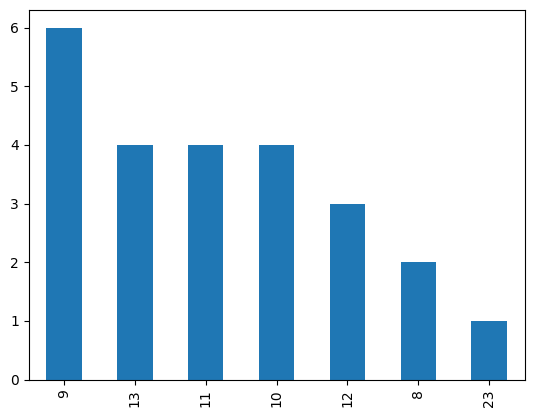

In [83]:
short_efsyn_df['hour'].value_counts().plot(kind='bar')

In [84]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt


In [85]:
short_efsyn_df[short_efsyn_df['hour']==9]['text']

15    180 βουλευτές αναζητά η Ν.Δ. για... μετωπική μ...
16    Η δεύτερη κάλπη, τα σενάρια των εδρών και η κυ...
17    Η μεγαλύτερη διαφορά της μεταπολίτευσης Μοναδι...
18    Νικητής στον Εβρο για τον ΣΥΡΙΖΑ ο Μενέλαος Μα...
19    Εκλογές 2023: Γύρισαν την πλάτη στους διάσημου...
20    Αντιπολίτευση υπέρ κοινωνίας Το εκλογικό επιτε...
Name: text, dtype: object

In [ ]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
#text = short_efsyn_df['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')


In [86]:
text = short_efsyn_df[short_efsyn_df['day']==23]['text'].str.cat(sep = ' ').replace("amp", ' ')


In [87]:
text

'Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδικάστε το μαύρο μέτωπο της Δεξιάς Στο δρόμο του ασίγαστου λαϊκού αγώνα για να ανατραπεί η πολιτική της φτώχειας, της ακρίβειας και της ανεργίας, για Ειρήνη, Δουλειά, Δημοκρατία, Εθνική Ανεξαρτησία, Σοσιαλισμό, καλεί τους πολίτες το Μ-Λ ΚΚΕ. Το μπλοκ των «ικανοποιημένων» και η… απιστία της μεσαίας τάξης Τι εκπροσωπεί το θριαμβευτικό εκλογικό αποτέλεσμα της Ν.Δ.; Εναν κοινωνικό συνασπισμό συμφερόντων των ικανοποιημένων από τη διακυβέρνηση Μητσοτάκη -σε μορφή πυραμίδας- όσων είδαν τη ζωή τους και τις δουλειές... Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης  Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερες κάλπες. Ο πρόεδρος του ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ. μεταβαίνει σήμερα το απόγευμα στην Πρόεδρο της Δημοκρατίας προκειμένου να παραλάβει την τρίτη διερευνητική εντολή, στο... Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετικά κόμματα Ο Κυριάκος Βελλόπουλος και ο Δημήτρης Βενιέρης - Βελόπουλος θα βρεθούν στη νέα Βουλή μετά τα αποτελέσματα που έβγαλε η κάλπη της Κ

In [88]:
list(STOPWORDS)[0:20]

["don't",
 "you're",
 'for',
 'any',
 "shouldn't",
 'r',
 'off',
 "they'd",
 "why's",
 'each',
 'with',
 "you'd",
 'so',
 'the',
 "where's",
 'some',
 'yourselves',
 'herself',
 "that's",
 'own']

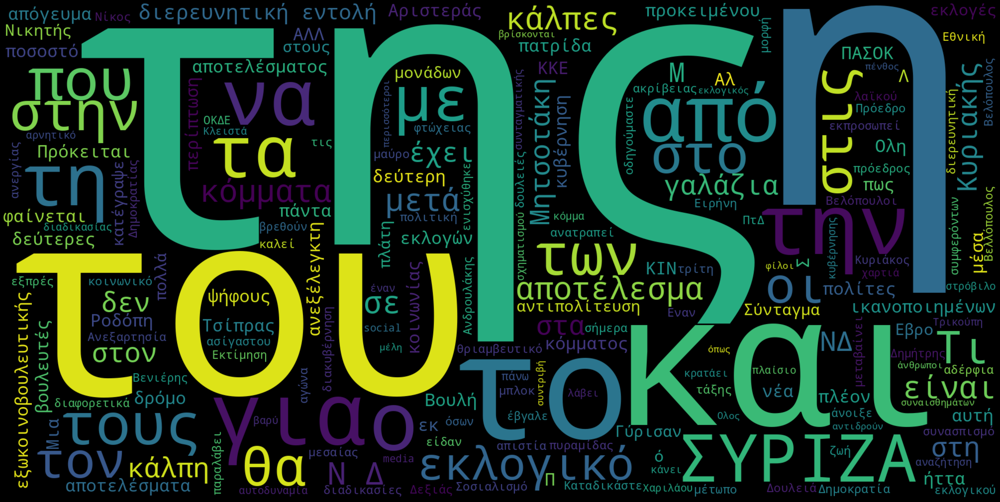

In [89]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Ας ψάξουμε τα Ελληνικά stopwords.....

In [90]:
import spacy

In [91]:
#!python -m spacy download el_core_news_sm

# Επειτα κάνουμε Runtime ->  Restart Runtime, για να δει τις αλλαγές από το download...

2023-05-23 11:41:31.653963: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 48.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [92]:
nlp = spacy.load('el_core_news_sm')

In [93]:
list(nlp.Defaults.stop_words)[0:20]

['ολότελα',
 'έναν',
 'όσα',
 'έξω',
 'συχνός',
 'οποιωνδήποτε',
 'μερικά',
 'ος',
 'εδώ',
 'λόγω',
 'οποίους',
 'συχνάς',
 'κανένας',
 'ταύτοταύτον',
 'πάρα',
 'μπορούν',
 'μία',
 'ξανά',
 'οποίαν',
 'οποίου']

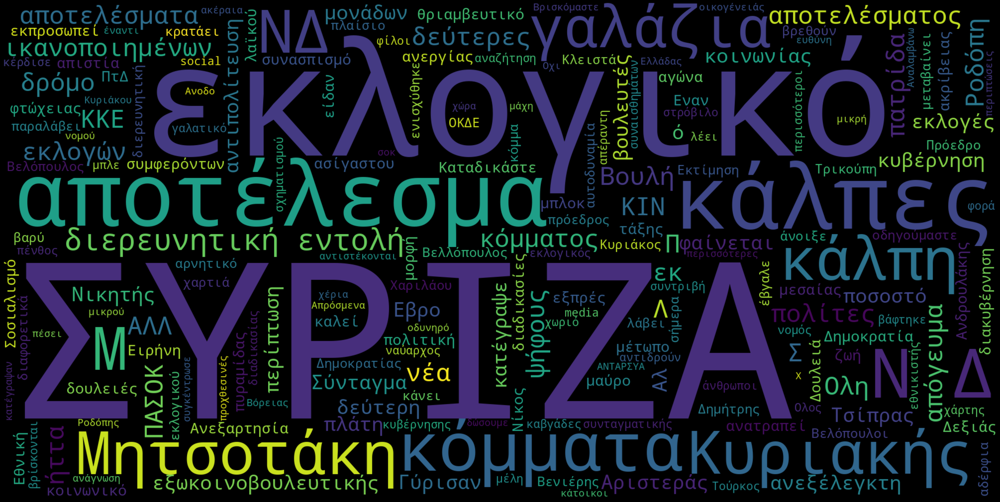

In [94]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Ας βρούμε για καθε λέξη που βρίσκεται σε διαφορετικές πτώσεις στην ονομαστική, και τα ρήματα στο 1ο πρόσωπο...

In [96]:
doc = nlp(short_efsyn_df['text'][1])

In [97]:
for token in doc:
    print(token, token.lemma_)

Το ο
μπλοκ μπλοκ
των ο
« «
ικανοποιημένων ικανοποιημένων
» »
και και
η ο
… …
απιστία απιστία
της ο
μεσαίας μεσαίος
τάξης τάξη
Τι Τι
εκπροσωπεί εκπροσωπώ
το ο
θριαμβευτικό θριαμβευτικός
εκλογικό εκλογικός
αποτέλεσμα αποτέλεσμα
της ο
Ν.Δ. Ν.Δ.
; ;
Εναν εναν
κοινωνικό κοινωνικός
συνασπισμό συνασπισμός
συμφερόντων συμφερόντων
των ο
ικανοποιημένων ικανοποιημένος
από από
τη ο
διακυβέρνηση διακυβέρνηση
Μητσοτάκη Μητσοτάκη
-σε -σε
μορφή μορφή
πυραμίδας πυραμίδα
- -
όσων όσος
είδαν είδαν
τη ο
ζωή ζωή
τους μου
και και
τις ο
δουλειές δουλειά
... ...


In [98]:
' '.join(token.lemma_ for token in doc)

'ο μπλοκ ο « ικανοποιημένων » και ο … απιστία ο μεσαίος τάξη Τι εκπροσωπώ ο θριαμβευτικός εκλογικός αποτέλεσμα ο Ν.Δ. ; εναν κοινωνικός συνασπισμός συμφερόντων ο ικανοποιημένος από ο διακυβέρνηση Μητσοτάκη -σε μορφή πυραμίδα - όσος είδαν ο ζωή μου και ο δουλειά ...'

In [99]:
text

'Μ-Λ ΚΚΕ για τα αποτελέσματα των εκλογών: Καταδικάστε το μαύρο μέτωπο της Δεξιάς Στο δρόμο του ασίγαστου λαϊκού αγώνα για να ανατραπεί η πολιτική της φτώχειας, της ακρίβειας και της ανεργίας, για Ειρήνη, Δουλειά, Δημοκρατία, Εθνική Ανεξαρτησία, Σοσιαλισμό, καλεί τους πολίτες το Μ-Λ ΚΚΕ. Το μπλοκ των «ικανοποιημένων» και η… απιστία της μεσαίας τάξης Τι εκπροσωπεί το θριαμβευτικό εκλογικό αποτέλεσμα της Ν.Δ.; Εναν κοινωνικό συνασπισμό συμφερόντων των ικανοποιημένων από τη διακυβέρνηση Μητσοτάκη -σε μορφή πυραμίδας- όσων είδαν τη ζωή τους και τις δουλειές... Το απόγευμα στην ΠτΔ ο Νίκος Ανδρουλάκης  Με διαδικασίες εξπρές οδηγούμαστε στις δεύτερες κάλπες. Ο πρόεδρος του ΠΑΣΟΚ-ΚΙΝ.ΑΛΛ. μεταβαίνει σήμερα το απόγευμα στην Πρόεδρο της Δημοκρατίας προκειμένου να παραλάβει την τρίτη διερευνητική εντολή, στο... Τα αδέρφια Βελόπουλοι στη Βουλή με... διαφορετικά κόμματα Ο Κυριάκος Βελλόπουλος και ο Δημήτρης Βενιέρης - Βελόπουλος θα βρεθούν στη νέα Βουλή μετά τα αποτελέσματα που έβγαλε η κάλπη της Κ

In [100]:
full_doc = nlp(text)

In [101]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [102]:
clear_text[200:400]

' δημοκρατία , εθνικός Ανεξαρτησία , Σοσιαλισμό , καλώ ο πολίτης ο Μ-Λ ΚΚΕ . ο μπλοκ ο « ικανοποιημένων » και ο … απιστία ο μεσαίος τάξη Τι εκπροσωπώ ο θριαμβευτικός εκλογικός αποτέλεσμα ο Ν.Δ. ; εναν '

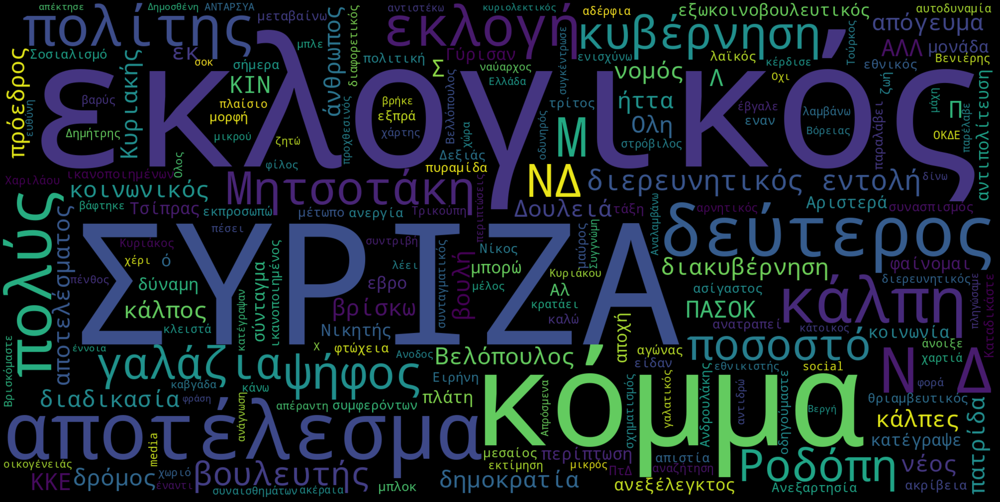

In [103]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# Vectorization starts here......

In [104]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [105]:
count_vector = cv.fit_transform(short_efsyn_df['text'])

In [106]:
count_vector.shape

(24, 460)

In [108]:
# cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

results.head()


,11,180,1974,2015,2019,2023,21ης,25,31,34,...,ψήφο,ψήφους,όλη,όπου,όπως,όσο,όσων,όταν,ότι,όχι
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
#cv.vocabulary_

In [116]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [117]:
count_vector = cv.fit_transform(short_efsyn_df['text'])

InvalidParameterError: ignored

In [112]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

results.head()


NotFittedError: ignored

In [113]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [114]:
 cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
 count_vector = cv.fit_transform(short_efsyn_df['text'])
 results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
 results.head()


InvalidParameterError: ignored

In [115]:
 cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
 count_vector = cv.fit_transform(short_efsyn_df['text'])
 results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
 results.head()




InvalidParameterError: ignored

In [ ]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\bκυ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(short_efsyn_df['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
results.head()


In [ ]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) #token_pattern = '\\bκυ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(short_efsyn_df['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
results.head()

In [ ]:
results.sum(axis =0).sort_values(ascending = False)

In [ ]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()   


In [ ]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bκ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκυβ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\bcov[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(short_efsyn_df['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
results.head()

In [ ]:
results.sum(axis =0).sort_values(ascending = False)

In [ ]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['covid19', 'κυβέρνηση']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(short_efsyn_df['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 
results.head()


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(short_efsyn_df['text'])  #finds the tfidf score with normalization


In [ ]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names_out()) 
results.head()

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

In [ ]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

In [ ]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

In [ ]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [ ]:
short_efsyn_df['text'].loc[3]

In [ ]:
short_efsyn_df['text'].loc[2823]